In [2]:
from tensorflow.keras.layers import LSTM, GRU, Conv1D, MaxPooling1D, GlobalMaxPooling1D, Bidirectional


In [3]:
import pandas as pd
import numpy as np
import re
import nltk
import random
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, GlobalAveragePooling1D, Dense, Dropout,
                                     LSTM, GRU, Conv1D, MaxPooling1D, GlobalMaxPooling1D, Bidirectional)
from tensorflow.keras.callbacks import ReduceLROnPlateau

nltk.download("stopwords")
nltk.download("wordnet")

# Configuration
VOCAB_SIZE = 5000
MAX_LEN = 100
embedding_dim = 100


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
import pandas as pd


file_path = "Paytm_Complaints.csv"  
df = pd.read_csv(file_path)

# Display the first few rows
print("🔹 First 5 rows of the dataset:")
print(df.head())

# Check data types and null values
print("\n🔹 Dataset Info:")
print(df.info())

# Check for missing values
print("\n🔹 Missing values per column:")
print(df.isnull().sum())

# Check number of unique categories
print("\n🔹 Unique complaint categories:")
print(df['Category'].value_counts())


🔹 First 5 rows of the dataset:
   Complaint ID                                     Complaint Text  \
0             1  Recharge amount was deducted but the service w...   
1             2  Customer support closed the complaint without ...   
2             3  Paytm - Merchant payment failed but wallet sho...   
3             4  KYC verification keeps getting rejected withou...   
4             5  Transaction failed but the amount was deducted...   

                 Category  
0   Payment Gateway Error  
1      Failed Transaction  
2   Duplicate Transaction  
3      Card Linking Issue  
4  Customer Support Delay  

🔹 Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Complaint ID    5000 non-null   int64 
 1   Complaint Text  5000 non-null   object
 2   Category        5000 non-null   object
dtypes: int64(1), object(2)
memory us

C:\Users\bikki\AppData\Local\Temp\ipykernel_9900\3705490635.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Category', data=df, order=df['Category'].value_counts().index, palette="viridis")


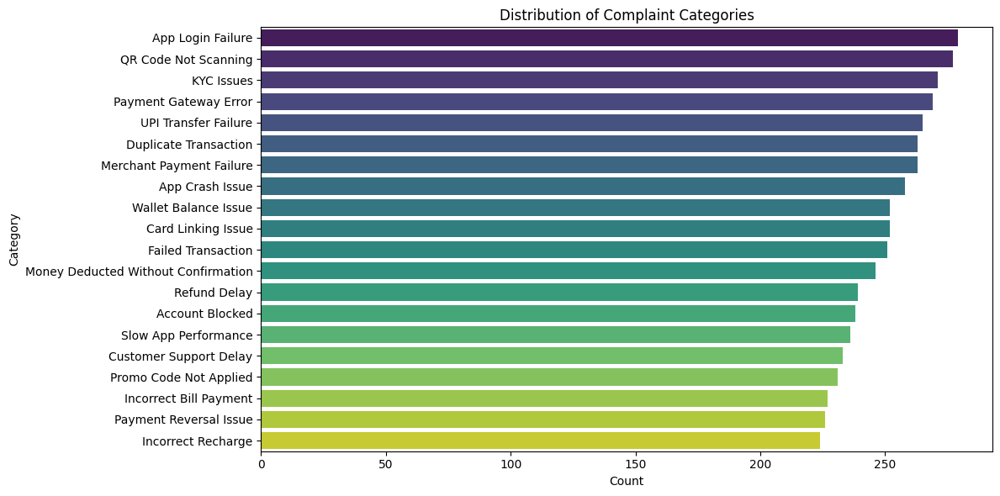

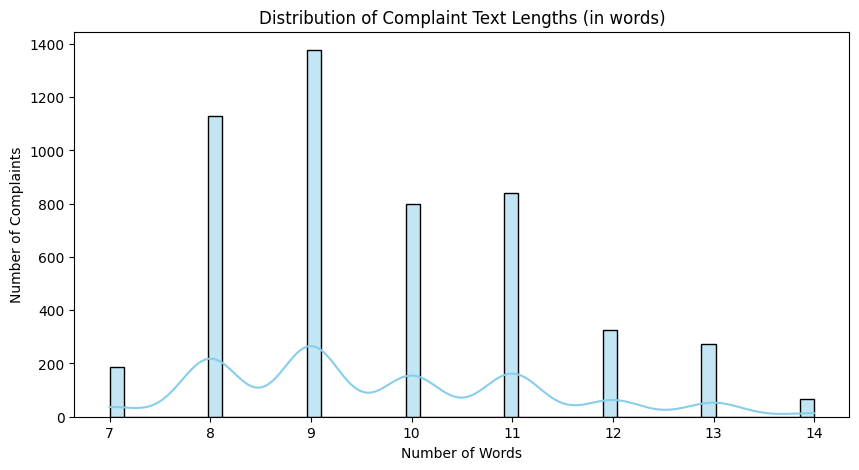

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Category Distribution
plt.figure(figsize=(12,6))
sns.countplot(y='Category', data=df, order=df['Category'].value_counts().index, palette="viridis")
plt.title("Distribution of Complaint Categories")
plt.xlabel("Count")
plt.ylabel("Category")
plt.tight_layout()
plt.show()

# 2. Complaint Length Analysis
df['text_length'] = df['Complaint Text'].apply(lambda x: len(x.split()))

plt.figure(figsize=(10,5))
sns.histplot(df['text_length'], bins=50, kde=True, color='skyblue')
plt.title("Distribution of Complaint Text Lengths (in words)")
plt.xlabel("Number of Words")
plt.ylabel("Number of Complaints")
plt.show()


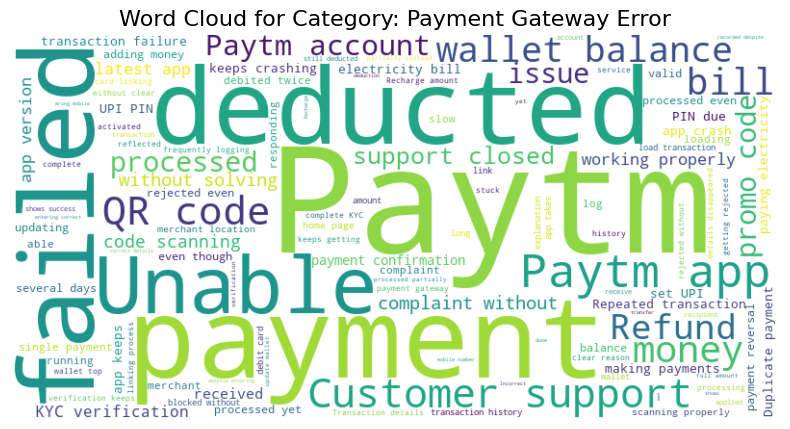

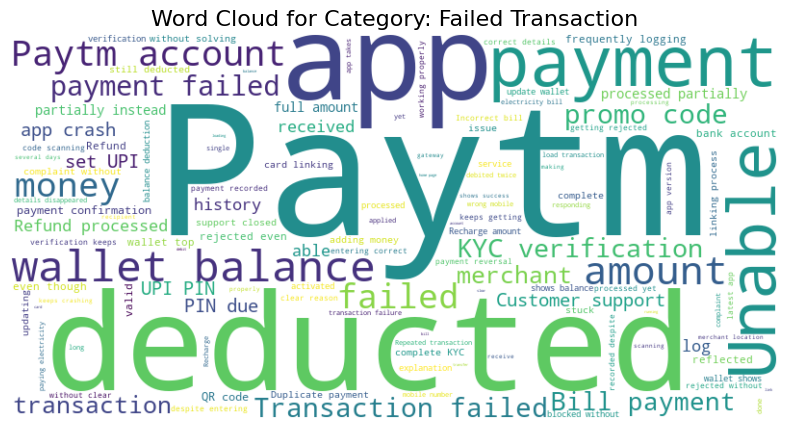

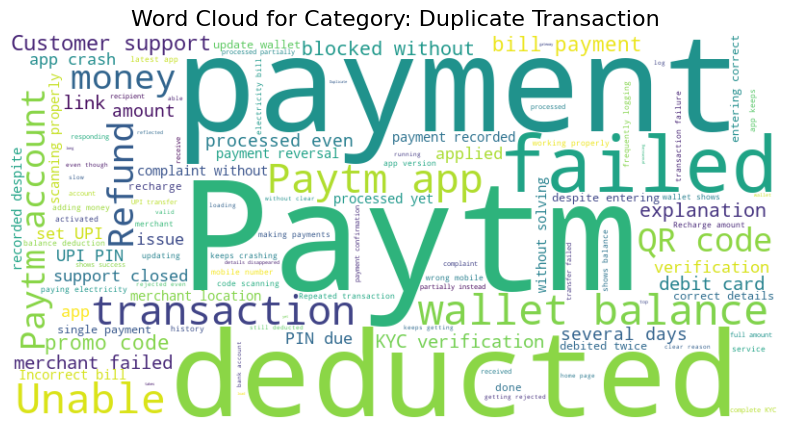

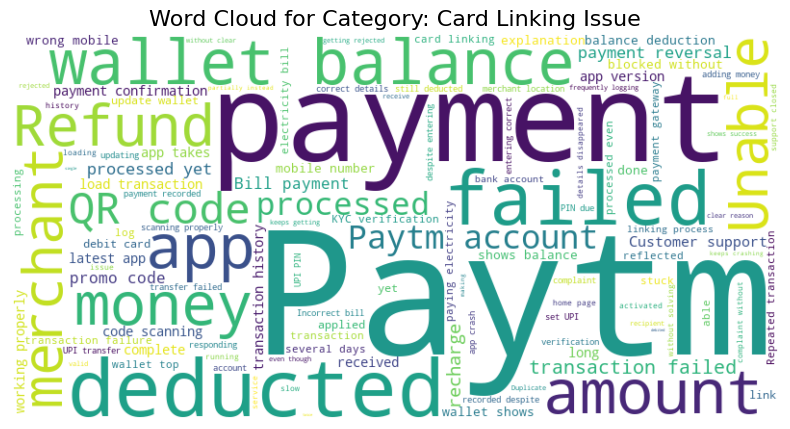

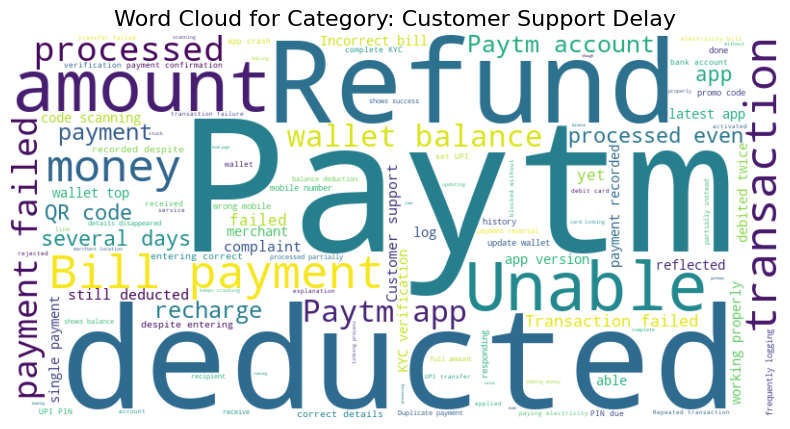

...

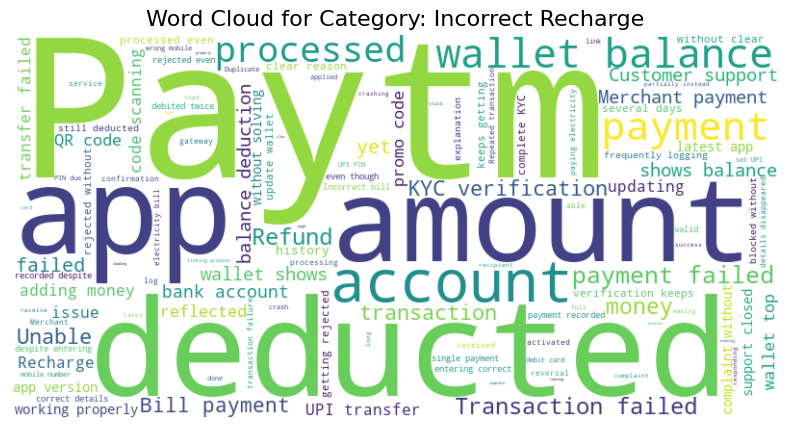

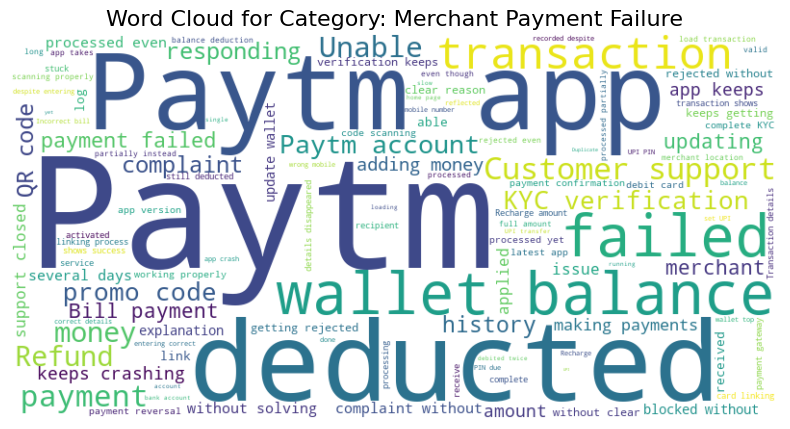

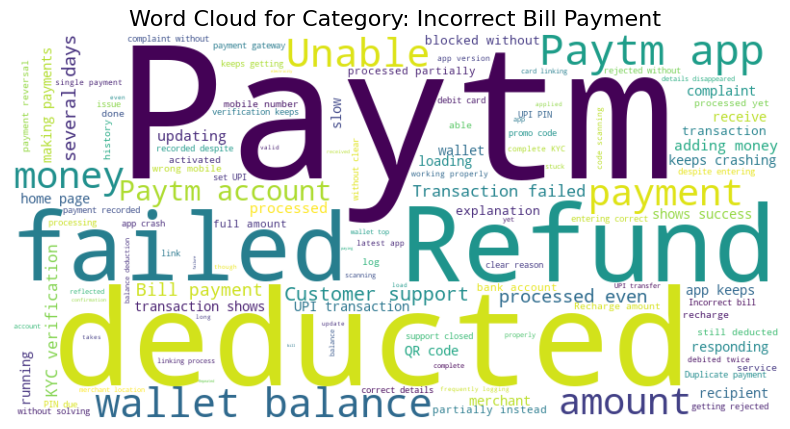

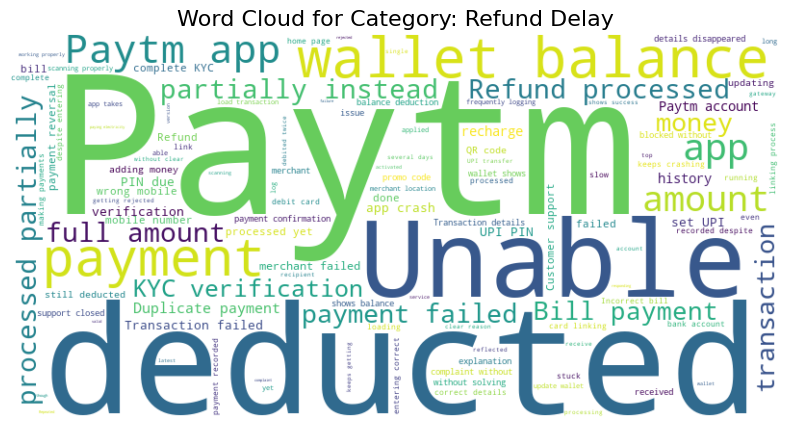

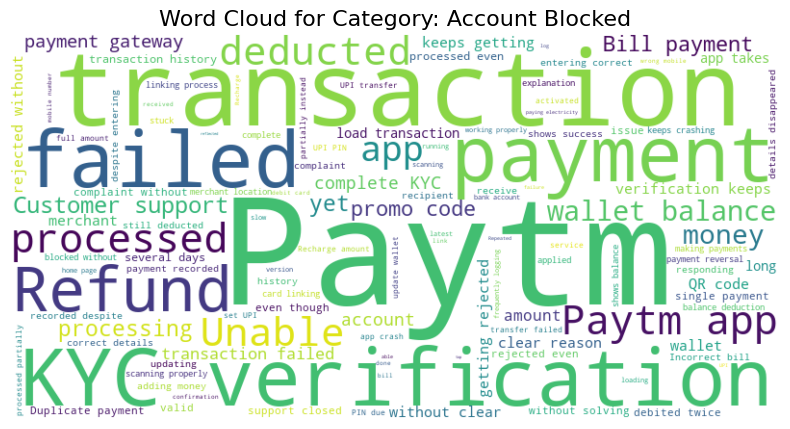

In [6]:
from wordcloud import WordCloud
# 📊 Word Clouds per Category
categories = df["Category"].unique()

for category in categories:
    text = " ".join(df[df["Category"] == category]["Complaint Text"].tolist())
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for Category: {category}", fontsize=16)
    plt.show()

In [ ]:
 
df.drop_duplicates(subset='Complaint Text', inplace=True)

# Text Cleaning
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-z\s]", "", text)
    text = re.sub(r"\s+", " ", text)
    words = text.split()
    stop_words = set(stopwords.words("english"))
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return " ".join(words)

df["clean_text"] = df["Complaint Text"].astype(str).apply(clean_text)


In [5]:
def add_variation(text):
    variations = [
        text,
        text.replace("deducted", "charged"),
        text.replace("failed", "not successful"),
        text.replace("refund", "money return"),
        text + " please look into this",
        "issue: " + text,
        "complaint: " + text
    ]
    return random.choice(variations)

df_aug = pd.concat([df]*50, ignore_index=True)
df_aug["Complaint Text"] = df_aug["Complaint Text"].astype(str).apply(add_variation)
df_aug["clean_text"] = df_aug["Complaint Text"].apply(clean_text)


In [6]:
# Label encoding
le = LabelEncoder()
df_aug["Category"] = le.fit_transform(df["Category"].tolist() * 50)
num_classes = len(le.classes_)

# Tokenization
tokenizer = Tokenizer(num_words=VOCAB_SIZE, oov_token="<OOV>")
tokenizer.fit_on_texts(df_aug["clean_text"])
sequences = tokenizer.texts_to_sequences(df_aug["clean_text"])
padded = pad_sequences(sequences, maxlen=MAX_LEN)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(padded, df_aug["Category"], test_size=0.2, random_state=42)


In [7]:
# Load GloVe (make sure file is in working directory)
embeddings_index = {}
with open("glove.6B.100d.txt", encoding="utf8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        vectors = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = vectors

# Create embedding matrix
embedding_matrix = np.zeros((VOCAB_SIZE, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < VOCAB_SIZE:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector


In [9]:
def build_ffnn_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [10]:
def build_lstm_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Bidirectional(LSTM(64, return_sequences=True))(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [11]:
def build_gru_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Bidirectional(GRU(64, return_sequences=True))(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [12]:
def build_cnn_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Conv1D(128, 5, activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)
    x = GlobalMaxPooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [13]:
def train_and_evaluate(model, model_name):
    lr_callback = ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.5, verbose=1)
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test),
                        epochs=30, batch_size=128, callbacks=[lr_callback], verbose=1)

    loss, acc = model.evaluate(X_test, y_test)
    print(f"\n✅ {model_name} Accuracy: {acc*100:.2f}%")

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)

    print("\n📊 Classification Report:\n")
    print(classification_report(y_test, y_pred, target_names=le.classes_))

    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - accuracy: 0.1088 - loss: 2.7832 - val_accuracy: 0.0986 - val_loss: 2.6772 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.1151 - loss: 2.7094 - val_accuracy: 0.1451 - val_loss: 2.6732 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.1318 - loss: 2.6842 - val_accuracy: 0.1493 - val_loss: 2.6603 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.1316 - loss: 2.6804 - val_accuracy: 0.2000 - val_loss: 2.6452 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.1470 - loss: 2.6542 - val_accuracy: 0.0986 - val_loss: 2.6410 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.1573 - loss: 2.6448 - val_accuracy: 0.1451 - val_loss: 2.6022 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.1721 - loss: 2.6265 - val_acc

c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` par

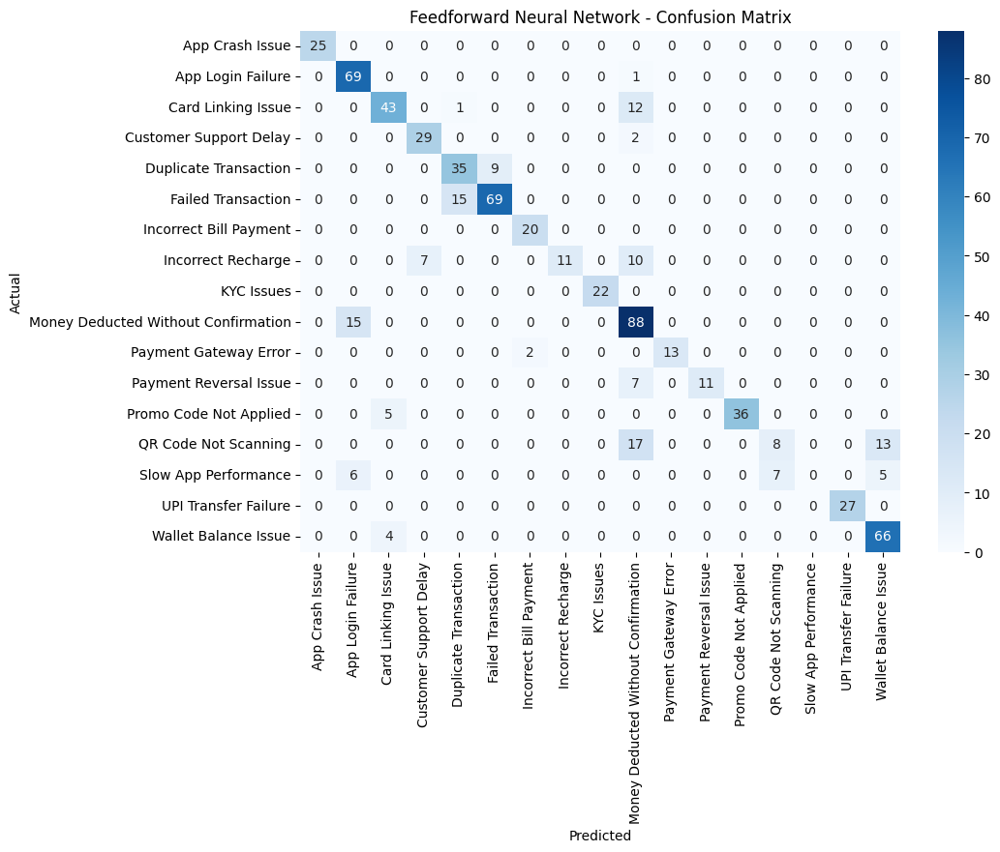

c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 18s 332ms/step - accuracy: 0.1114 - loss: 2.7989 - val_accuracy: 0.1451 - val_loss: 2.6837 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - accuracy: 0.1251 - loss: 2.7028 - val_accuracy: 0.1761 - val_loss: 2.6646 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 354ms/step - accuracy: 0.1505 - loss: 2.6614 - val_accuracy: 0.1859 - val_loss: 2.4409 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 296ms/step - accuracy: 0.2007 - loss: 2.4459 - val_accuracy: 0.2310 - val_loss: 2.3367 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 333ms/step - accuracy: 0.2146 - loss: 2.3039 - val_accuracy: 0.3028 - val_loss: 2.0732 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 307ms/step - accuracy: 0.2776 - loss: 2.0564 - val_accuracy: 0.3225 - val_loss: 1.8833 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 349ms/step - accuracy: 0.3154 - loss: 1.8726 -

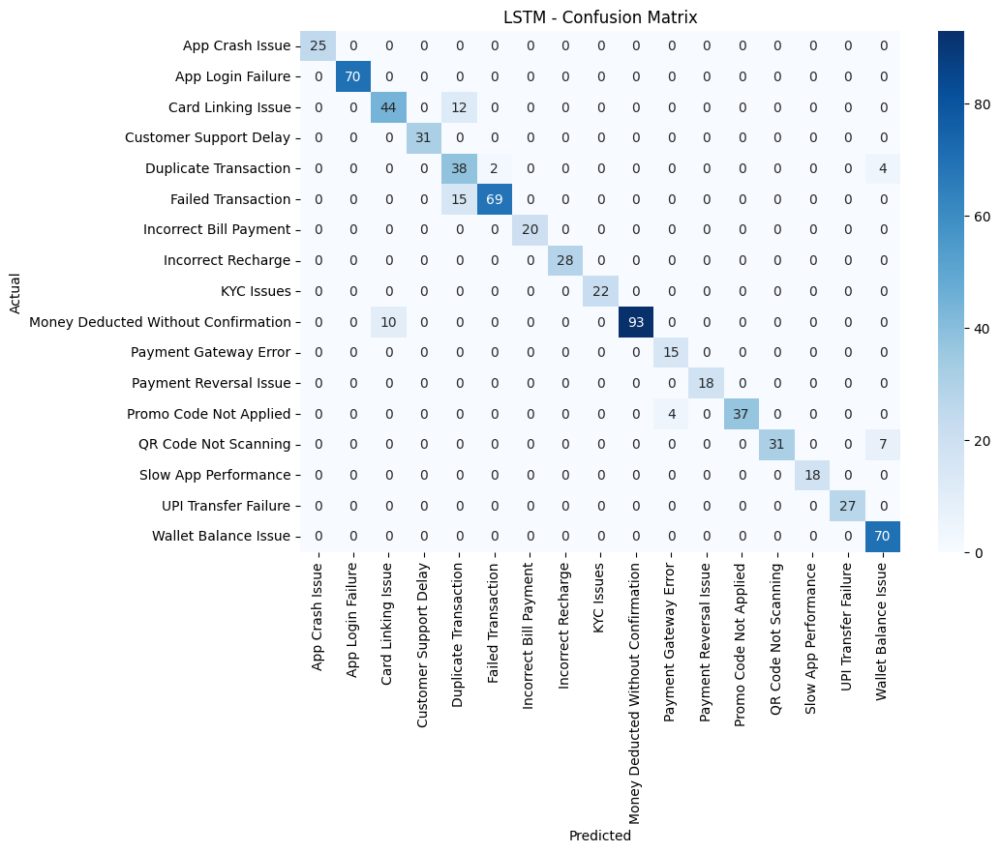

c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 384ms/step - accuracy: 0.1100 - loss: 2.7840 - val_accuracy: 0.1507 - val_loss: 2.6952 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 400ms/step - accuracy: 0.1268 - loss: 2.7069 - val_accuracy: 0.1056 - val_loss: 2.6686 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - accuracy: 0.1264 - loss: 2.6872 - val_accuracy: 0.1803 - val_loss: 2.6480 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - accuracy: 0.1410 - loss: 2.6613 - val_accuracy: 0.1901 - val_loss: 2.5761 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - accuracy: 0.2029 - loss: 2.5534 - val_accuracy: 0.2859 - val_loss: 2.1700 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 255ms/step - accuracy: 0.3256 - loss: 2.0263 - val_accuracy: 0.3972 - val_loss: 1.6040 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - accuracy: 0.4401 - loss: 1.5310 

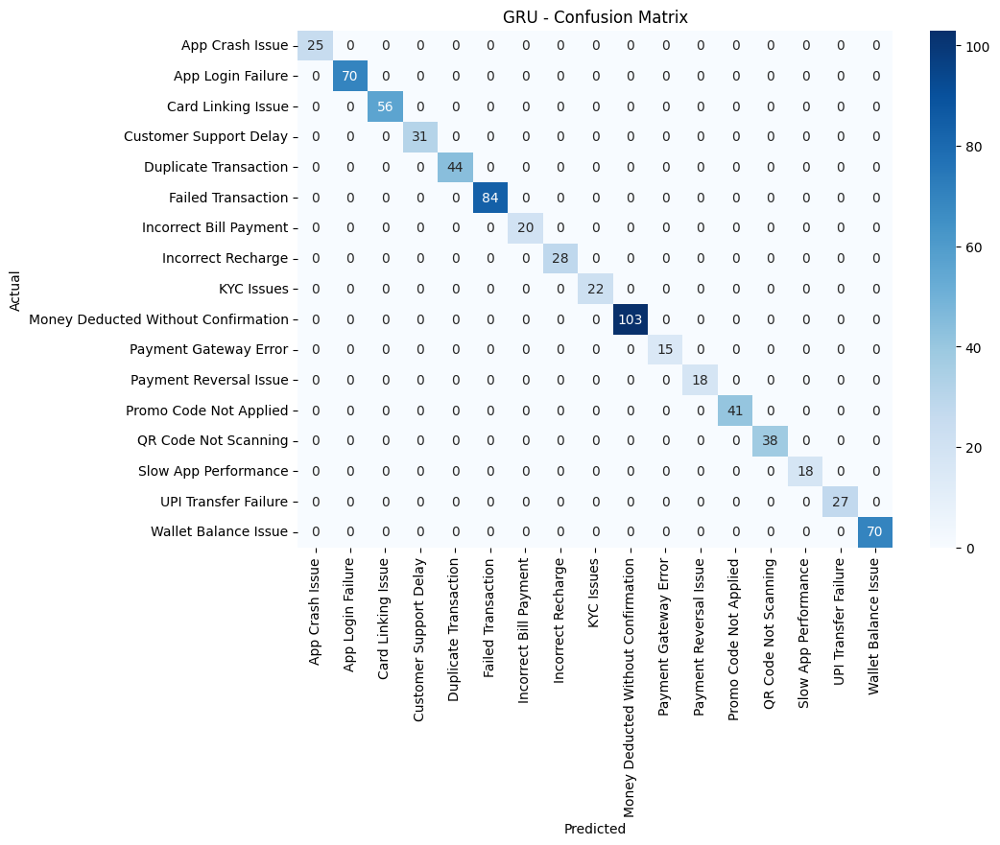

Epoch 1/30


c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - accuracy: 0.2294 - loss: 2.5029 - val_accuracy: 0.5718 - val_loss: 1.4451 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.5441 - loss: 1.4048 - val_accuracy: 0.6577 - val_loss: 0.7704 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.6254 - loss: 0.9352 - val_accuracy: 0.7423 - val_loss: 0.5780 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.6878 - loss: 0.7195 - val_accuracy: 0.8465 - val_loss: 0.4112 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - accuracy: 0.7779 - loss: 0.5406 - val_accuracy: 0.9634 - val_loss: 0.2242 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.8936 - loss: 0.3323 - val_accuracy: 1.0000 - val_loss: 0.0669 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.9579 - loss: 0.1772 - val_accuracy: 1.00

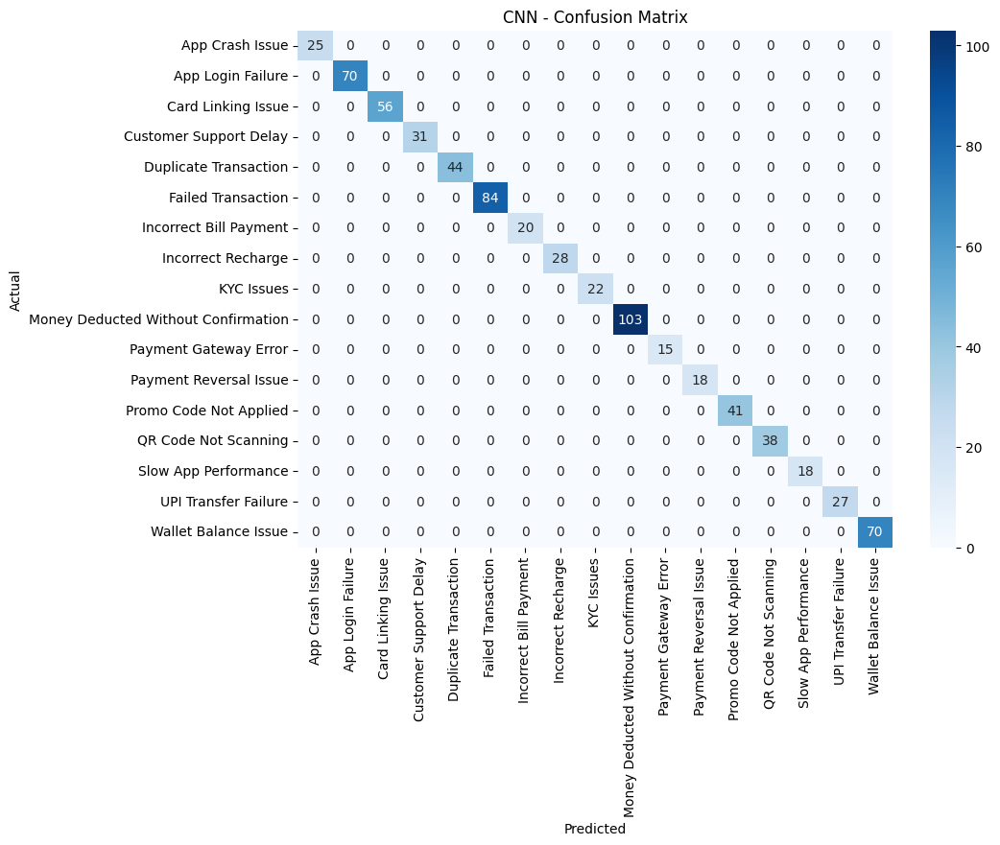

In [14]:
ffnn_model = build_ffnn_model()
train_and_evaluate(ffnn_model, "Feedforward Neural Network")

lstm_model = build_lstm_model()
train_and_evaluate(lstm_model, "LSTM")

gru_model = build_gru_model()
train_and_evaluate(gru_model, "GRU")

cnn_model = build_cnn_model()
train_and_evaluate(cnn_model, "CNN")


In [15]:
from tensorflow.keras.layers import Layer
import tensorflow.keras.backend as K

class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], 1),
                                 initializer='random_normal', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[1], 1),
                                 initializer='zeros', trainable=True)
        super(Attention, self).build(input_shape)

    def call(self, x):
        e = K.tanh(K.dot(x, self.W) + self.b)
        a = K.softmax(e, axis=1)
        output = x * a
        return K.sum(output, axis=1)


In [16]:
def build_lstm_attention_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(VOCAB_SIZE, embedding_dim, weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Bidirectional(LSTM(64, return_sequences=True))(x)
    x = Attention()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(



Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - accuracy: 0.1074 - loss: 2.7775 - val_accuracy: 0.0986 - val_loss: 2.6832 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - accuracy: 0.1271 - loss: 2.6824 - val_accuracy: 0.2704 - val_loss: 2.5307 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - accuracy: 0.2468 - loss: 2.4221 - val_accuracy: 0.3887 - val_loss: 1.9066 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - accuracy: 0.3850 - loss: 1.7880 - val_accuracy: 0.4310 - val_loss: 1.4249 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - accuracy: 0.5026 - loss: 1.3592 - val_accuracy: 0.6113 - val_loss: 1.0308 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 235ms/step - accuracy: 0.5699 - loss: 1.0765 - val_accuracy: 0.6056 - val_loss: 0.8584 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 235ms/step - accuracy: 0.6131 - loss: 0.9251 

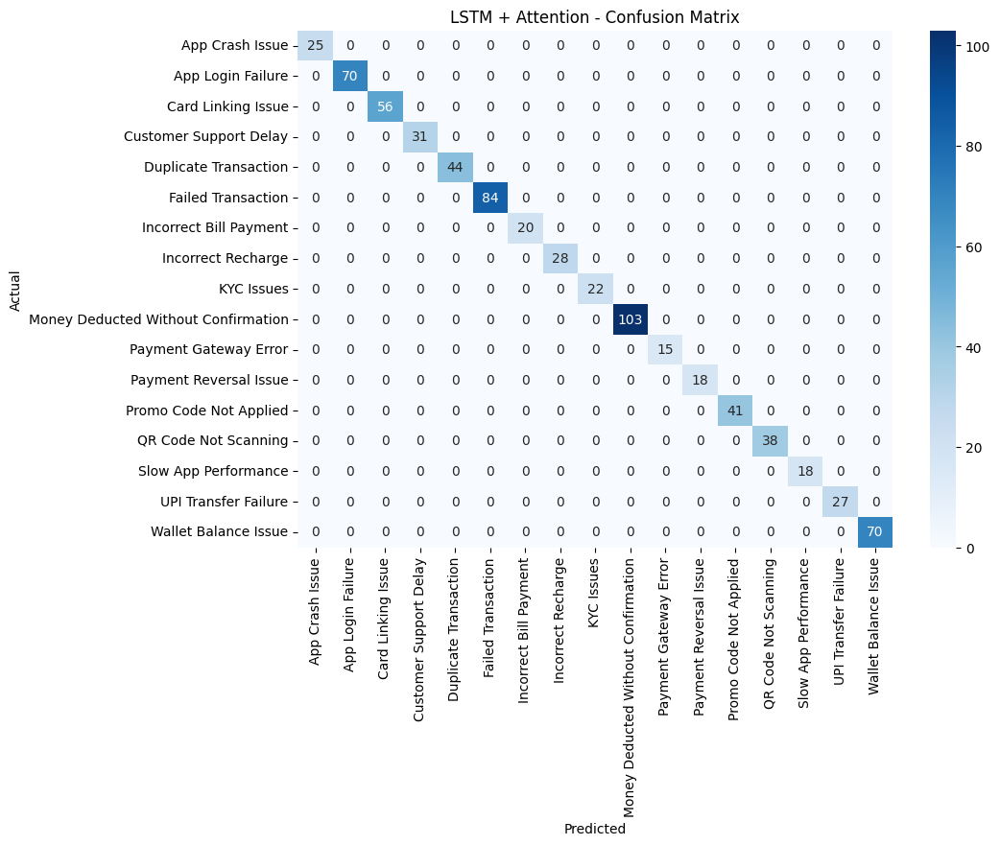

In [17]:
att_model = build_lstm_attention_model()
train_and_evaluate(att_model, "LSTM + Attention")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
C:\Users\bikki\AppData\Local\Temp\ipykernel_5752\884474392.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Category', data=df, order=df['Category'].value_counts().index, palette="viridis")


🔹 First 5 rows of the dataset:
   Complaint ID                                     Complaint Text  \
0             1  Recharge amount was deducted but the service w...   
1             2  Customer support closed the complaint without ...   
2             3  Paytm - Merchant payment failed but wallet sho...   
3             4  KYC verification keeps getting rejected withou...   
4             5  Transaction failed but the amount was deducted...   

                 Category  
0   Payment Gateway Error  
1      Failed Transaction  
2   Duplicate Transaction  
3      Card Linking Issue  
4  Customer Support Delay  

🔹 Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Complaint ID    5000 non-null   int64 
 1   Complaint Text  5000 non-null   object
 2   Category        5000 non-null   object
dtypes: int64(1), object(2)
memory us

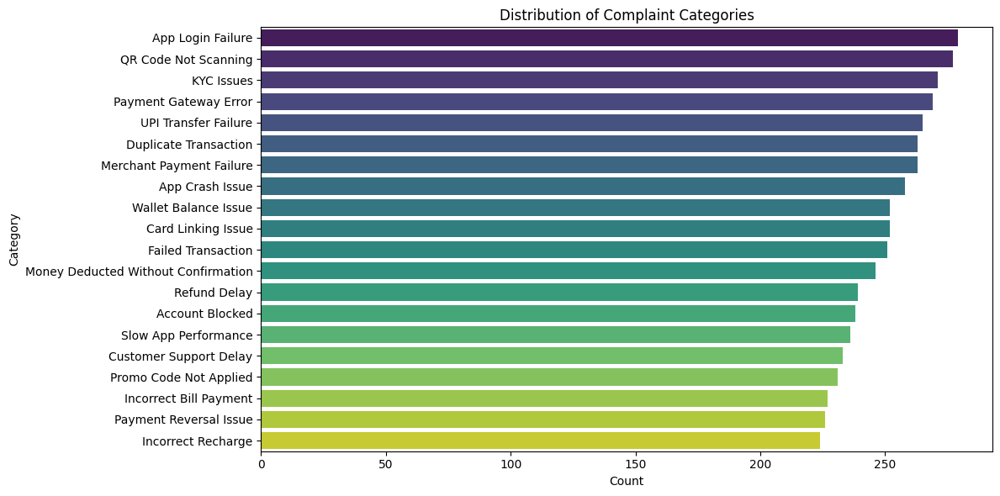

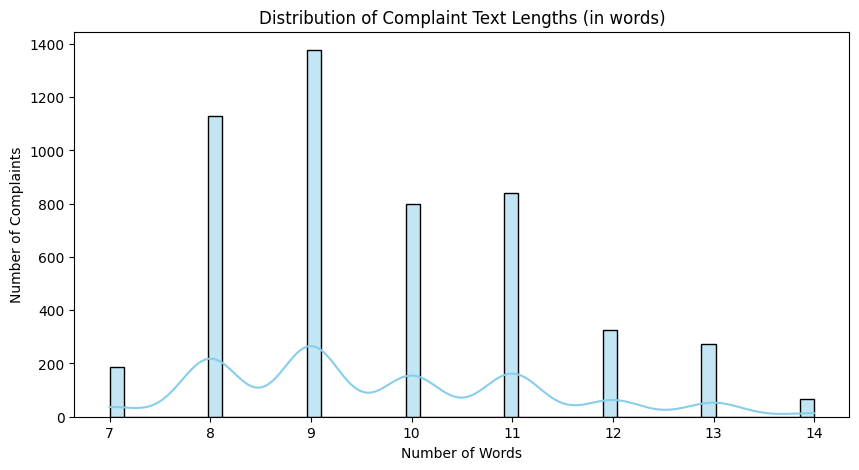

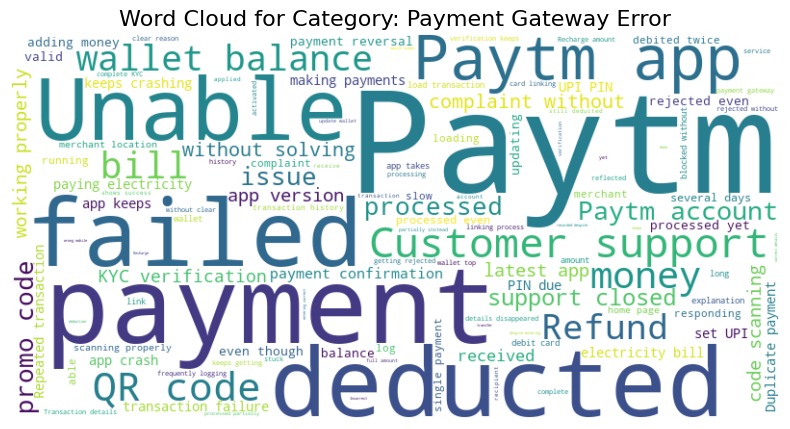

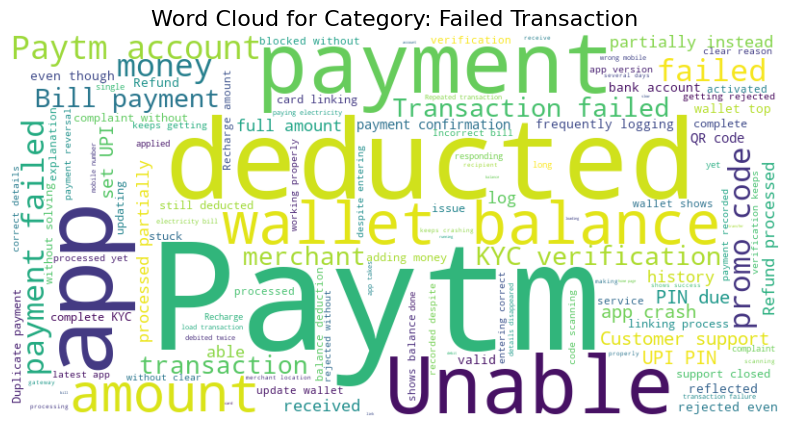

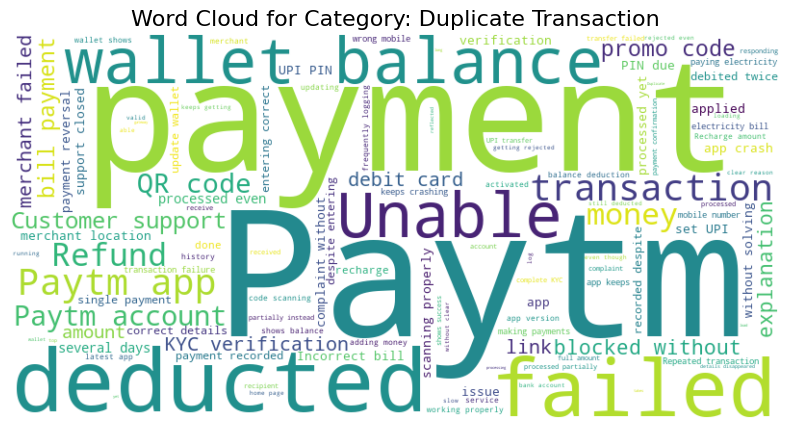

...

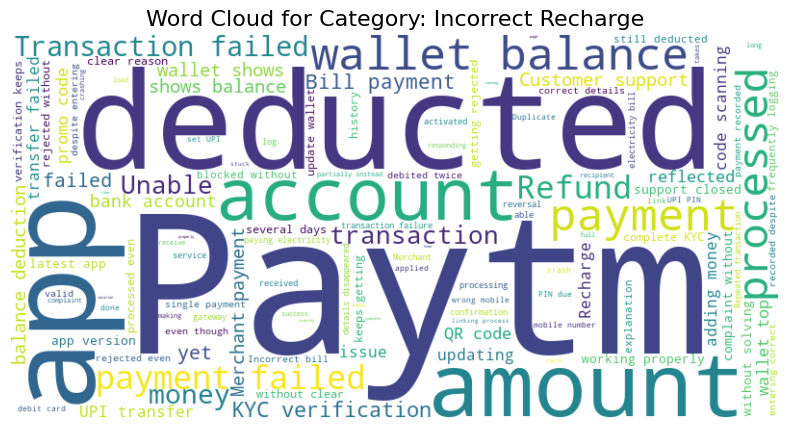

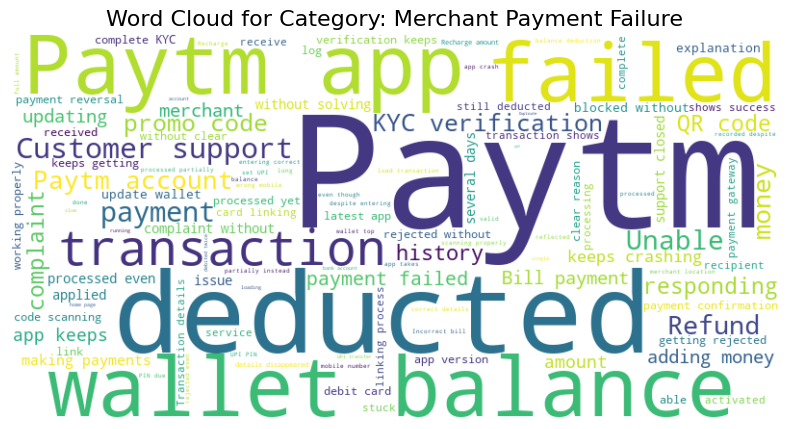

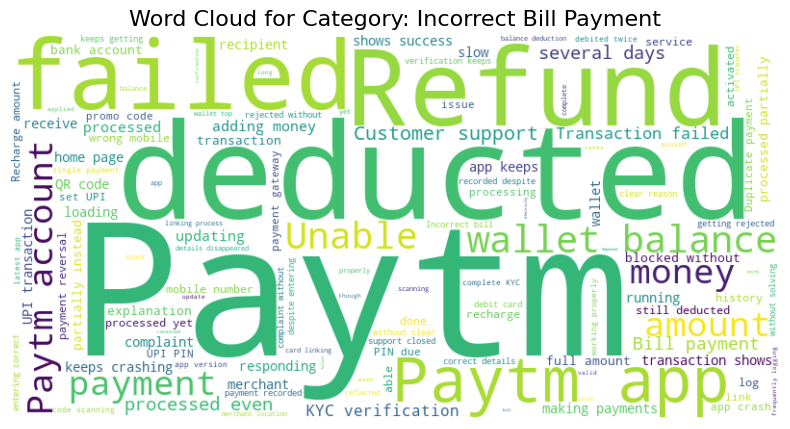

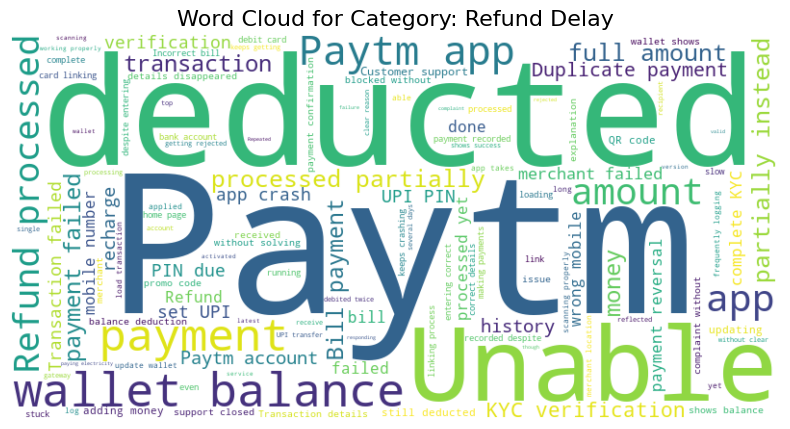

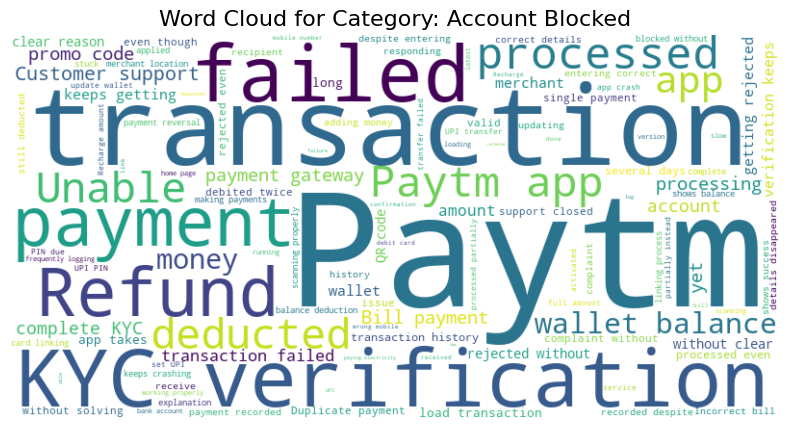

c:\Users\bikki\OneDrive\Documents\Gradious\Gradious_NLP_project\nlpenv\Lib\site-packages\keras\src\layers\core\embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 351ms/step - accuracy: 0.1138 - loss: 2.7868 - val_accuracy: 0.1465 - val_loss: 2.6915 - learning_rate: 0.0010
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 292ms/step - accuracy: 0.1030 - loss: 2.7029 - val_accuracy: 0.1451 - val_loss: 2.6707 - learning_rate: 0.0010
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 292ms/step - accuracy: 0.1193 - loss: 2.6880 - val_accuracy: 0.1451 - val_loss: 2.6540 - learning_rate: 0.0010
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 308ms/step - accuracy: 0.1437 - loss: 2.6613 - val_accuracy: 0.1873 - val_loss: 2.6091 - learning_rate: 0.0010
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 292ms/step - accuracy: 0.1685 - loss: 2.5972 - val_accuracy: 0.2465 - val_loss: 2.3740 - learning_rate: 0.0010
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 303ms/step - accuracy: 0.2856 - loss: 2.2346 - val_accuracy: 0.4831 - val_loss: 1.5548 - learning_rate: 0.0010
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 362ms/step - accuracy: 0.4636 - loss: 1.4948 -

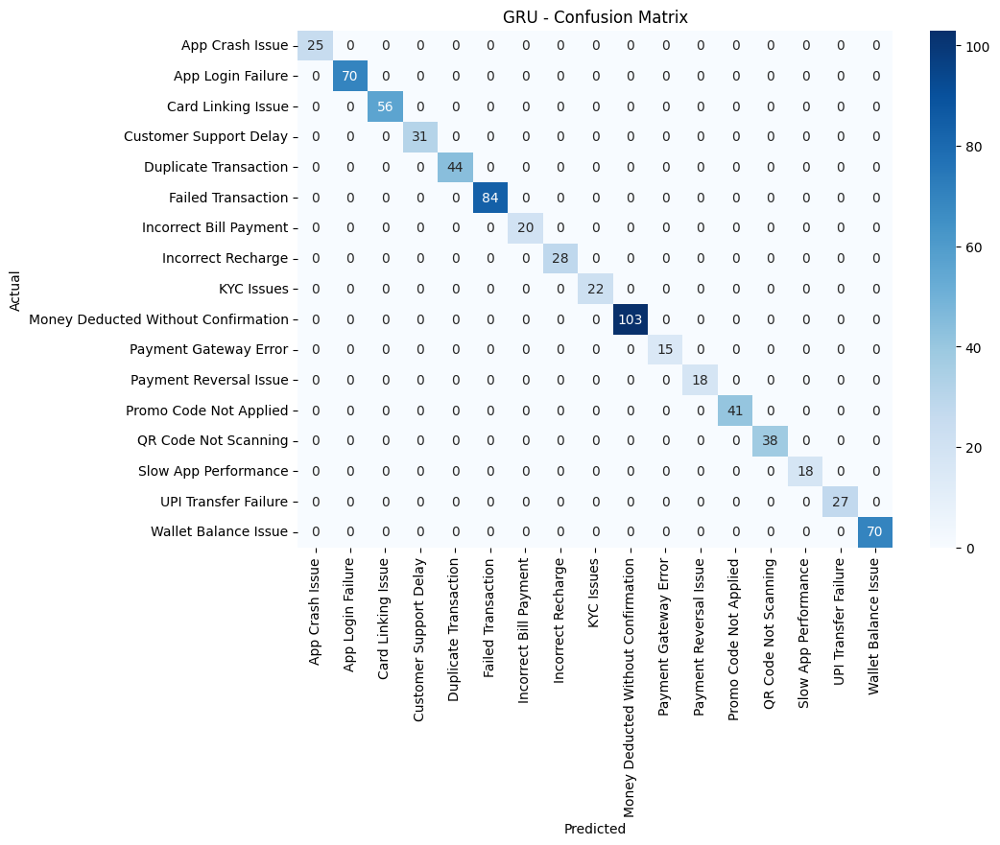

In [3]:
import pandas as pd
import numpy as np
import re
import nltk
import random
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, GlobalAveragePooling1D, Dense, Dropout,
                                     LSTM, GRU, Conv1D, MaxPooling1D, GlobalMaxPooling1D, Bidirectional)
from tensorflow.keras.callbacks import ReduceLROnPlateau

nltk.download("stopwords")
nltk.download("wordnet")

# Configuration
VOCAB_SIZE = 5000
MAX_LEN = 100
embedding_dim = 100

import pandas as pd

# Load the dataset (update the path if needed)
file_path = "Paytm_Complaints.csv"  
df = pd.read_csv(file_path)

# Display the first few rows
print("🔹 First 5 rows of the dataset:")
print(df.head())

# Check data types and null values
print("\n🔹 Dataset Info:")
print(df.info())

# Check for missing values
print("\n🔹 Missing values per column:")
print(df.isnull().sum())

# Check number of unique categories
print("\n🔹 Unique complaint categories:")
print(df['Category'].value_counts())

import matplotlib.pyplot as plt
import seaborn as sns

# 1. Category Distribution
plt.figure(figsize=(12,6))
sns.countplot(y='Category', data=df, order=df['Category'].value_counts().index, palette="viridis")
plt.title("Distribution of Complaint Categories")
plt.xlabel("Count")
plt.ylabel("Category")
plt.tight_layout()
plt.show()

# 2. Complaint Length Analysis
df['text_length'] = df['Complaint Text'].apply(lambda x: len(x.split()))

plt.figure(figsize=(10,5))
sns.histplot(df['text_length'], bins=50, kde=True, color='skyblue')
plt.title("Distribution of Complaint Text Lengths (in words)")
plt.xlabel("Number of Words")
plt.ylabel("Number of Complaints")
plt.show()

from wordcloud import WordCloud
# 📊 Word Clouds per Category
categories = df["Category"].unique()

for category in categories:
    text = " ".join(df[df["Category"] == category]["Complaint Text"].tolist())
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for Category: {category}", fontsize=16)
    plt.show()

 
df.drop_duplicates(subset='Complaint Text', inplace=True)

# Text Cleaning
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-z\s]", "", text)
    text = re.sub(r"\s+", " ", text)
    words = text.split()
    stop_words = set(stopwords.words("english"))
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return " ".join(words)

df["clean_text"] = df["Complaint Text"].astype(str).apply(clean_text)

def add_variation(text):
    variations = [
        text,
        text.replace("deducted", "charged"),
        text.replace("failed", "not successful"),
        text.replace("refund", "money return"),
        text + " please look into this",
        "issue: " + text,
        "complaint: " + text
    ]
    return random.choice(variations)

df_aug = pd.concat([df]*50, ignore_index=True)
df_aug["Complaint Text"] = df_aug["Complaint Text"].astype(str).apply(add_variation)
df_aug["clean_text"] = df_aug["Complaint Text"].apply(clean_text)

# Label encoding
le = LabelEncoder()
df_aug["Category"] = le.fit_transform(df["Category"].tolist() * 50)
num_classes = len(le.classes_)

# Tokenization
tokenizer = Tokenizer(num_words=VOCAB_SIZE, oov_token="<OOV>")
tokenizer.fit_on_texts(df_aug["clean_text"])
sequences = tokenizer.texts_to_sequences(df_aug["clean_text"])
padded = pad_sequences(sequences, maxlen=MAX_LEN)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(padded, df_aug["Category"], test_size=0.2, random_state=42)

# Load GloVe (make sure file is in working directory)
embeddings_index = {}
with open("glove.6B.100d.txt", encoding="utf8") as f:
    for line in f:
        values = line.split()
        word = values[0]
        vectors = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = vectors

# Create embedding matrix
embedding_matrix = np.zeros((VOCAB_SIZE, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < VOCAB_SIZE:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

def build_ffnn_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def build_lstm_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Bidirectional(LSTM(64, return_sequences=True))(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def build_gru_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Bidirectional(GRU(64, return_sequences=True))(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def build_cnn_model():
    input_ = Input(shape=(MAX_LEN,))
    x = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_dim,
                  weights=[embedding_matrix], input_length=MAX_LEN, trainable=True)(input_)
    x = Conv1D(128, 5, activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)
    x = GlobalMaxPooling1D()(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)
    output = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_, outputs=output)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def train_and_evaluate(model, model_name):
    lr_callback = ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.5, verbose=1)
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test),
                        epochs=30, batch_size=128, callbacks=[lr_callback], verbose=1)

    loss, acc = model.evaluate(X_test, y_test)
    print(f"\n✅ {model_name} Accuracy: {acc*100:.2f}%")

    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)

    print("\n📊 Classification Report:\n")
    print(classification_report(y_test, y_pred, target_names=le.classes_))

    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# ffnn_model = build_ffnn_model()
# train_and_evaluate(ffnn_model, "Feedforward Neural Network")

# lstm_model = build_lstm_model()
# train_and_evaluate(lstm_model, "LSTM")

gru_model = build_gru_model()
train_and_evaluate(gru_model, "GRU")

# cnn_model = build_cnn_model()
# train_and_evaluate(cnn_model, "CNN")


In [ ]:
# Save tokenizer to reuse later
with open('tokenizer.pkl', 'wb') as f:
    pickle.dump(tokenizer, f)


In [12]:
# Save GRU model
gru_model.save("gru_complaint_model.h5")

# Save tokenizer
import pickle
with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)

# Save label encoder
with open("label_encoder.pkl", "wb") as f:
    pickle.dump(le, f)


In [13]:
import numpy as np
import pickle
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')

# Constants
MAX_LEN = 100  # Must match your training setting

# Load saved model
model = load_model("gru_complaint_model.h5")

# Load tokenizer
with open("tokenizer.pkl", "rb") as f:
    tokenizer = pickle.load(f)

# Load label encoder
with open("label_encoder.pkl", "rb") as f:
    label_encoder = pickle.load(f)

# Text cleaning function (same as used in training)
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"[^a-z\s]", "", text)
    text = re.sub(r"\s+", " ", text)
    words = text.split()
    stop_words = set(stopwords.words("english"))
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(w) for w in words if w not in stop_words]
    return " ".join(words)

# 🔍 Function to predict category
def predict_complaint_category(text):
    cleaned = clean_text(text)
    seq = tokenizer.texts_to_sequences([cleaned])
    padded = pad_sequences(seq, maxlen=MAX_LEN)
    pred_probs = model.predict(padded)
    pred_class_index = np.argmax(pred_probs, axis=1)[0]
    pred_label = label_encoder.inverse_transform([pred_class_index])[0]
    return pred_label

# 🧪 Test input
user_input = input("Enter your complaint: ")
predicted_category = predict_complaint_category(user_input)
print("Predicted Category:", predicted_category)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\bikki\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
Predicted Category: App Crash Issue
